# Self-Driving Car Engineer Nanodegree

## Deep Learning

## Project: Build a Traffic Sign Recognition Classifier

---
## Step 0: Load The Data

In [1]:
# Load pickled data
import pickle

# reading training and testing data
training_file = 'train.p'
testing_file = 'test.p'

with open(training_file, mode='rb') as f:
    train = pickle.load(f)
with open(testing_file, mode='rb') as f:
    test = pickle.load(f)
    
X_train, y_train = train['features'], train['labels']
X_test, y_test = test['features'], test['labels']

In [2]:
# reading the signnames files 
import pandas as pd
signnames_df = pd.read_csv("signnames.csv")
print(signnames_df.shape)
print(signnames_df)

(43, 2)
    ClassId                                           SignName
0         0                               Speed limit (20km/h)
1         1                               Speed limit (30km/h)
2         2                               Speed limit (50km/h)
3         3                               Speed limit (60km/h)
4         4                               Speed limit (70km/h)
5         5                               Speed limit (80km/h)
6         6                        End of speed limit (80km/h)
7         7                              Speed limit (100km/h)
8         8                              Speed limit (120km/h)
9         9                                         No passing
10       10       No passing for vechiles over 3.5 metric tons
11       11              Right-of-way at the next intersection
12       12                                      Priority road
13       13                                              Yield
14       14                                    

---

## Step 1: Dataset Summary & Exploration

The pickled data is a dictionary with 4 key/value pairs:

- `'features'` is a 4D array containing raw pixel data of the traffic sign images, (num examples, width, height, channels).
- `'labels'` is a 2D array containing the label/class id of the traffic sign. The file `signnames.csv` contains id -> name mappings for each id.
- `'sizes'` is a list containing tuples, (width, height) representing the the original width and height the image.
- `'coords'` is a list containing tuples, (x1, y1, x2, y2) representing coordinates of a bounding box around the sign in the image. **THESE COORDINATES ASSUME THE ORIGINAL IMAGE. THE PICKLED DATA CONTAINS RESIZED VERSIONS (32 by 32) OF THESE IMAGES**

Complete the basic data summary below.

In [3]:
import numpy as np

# Number of training examples
n_train = X_train.shape[0]

# Number of testing examples.
n_test = X_test.shape[0]

# shape of a traffic sign image
image_shape = X_train[0].shape

# unique classes/labels in the dataset
n_classes = len(np.unique(train['labels']))

print("Number of training examples =", n_train)
print("Number of testing examples =", n_test)
print("Image data shape =", image_shape)
print("Number of classes =", n_classes)

Number of training examples = 39209
Number of testing examples = 12630
Image data shape = (32, 32, 3)
Number of classes = 43


Visualize the German Traffic Signs Dataset using the pickled file(s).

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]


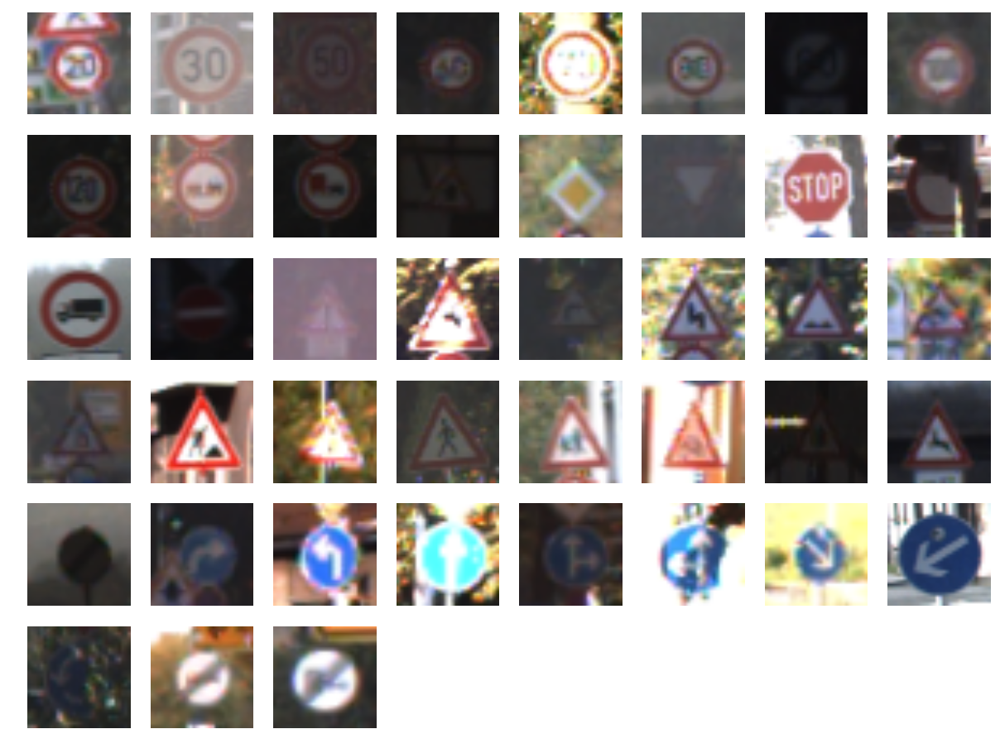

In [4]:
### Data exploration and visualization 
import matplotlib.pyplot as plt
# Visualizations will be shown in the notebook.
%matplotlib inline
import matplotlib.image as mpimg

# displays first image from every class
def show_images(images, labels):
    """Display the first image of each label."""
    unique_labels = np.unique(labels)
    print(unique_labels)
    plt.figure(figsize=(15, 15))
    i = 1
    for label in unique_labels:
        # Pick the first image for each label.
        image = images[np.where(labels==label)][0]
        plt.subplot(8, 8, i)  # A grid of 8 rows x 8 columns
        plt.axis('off')
        i += 1
        _ = plt.imshow(image)
    plt.show()

show_images(X_train, y_train)

[[   0    1    2    3    4    5    6    7    8    9   10   11   12   13
    14   15   16   17   18   19   20   21   22   23   24   25   26   27
    28   29   30   31   32   33   34   35   36   37   38   39   40   41
    42]
 [ 210 2220 2250 1410 1980 1860  420 1440 1410 1470 2010 1320 2100 2160
   780  630  420 1110 1200  210  360  330  390  510  270 1500  600  240
   540  270  450  780  240  689  420 1200  390  210 2070  300  360  240
   240]]
[[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
   18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
   36  37  38  39  40  41  42]
 [ 60 720 750 450 660 630 150 450 450 480 660 420 690 720 270 210 150 360
  390  60  90  90 120 150  90 480 180  60 150  90 150 270  60 210 120 390
  120  60 690  90  90  60  90]]


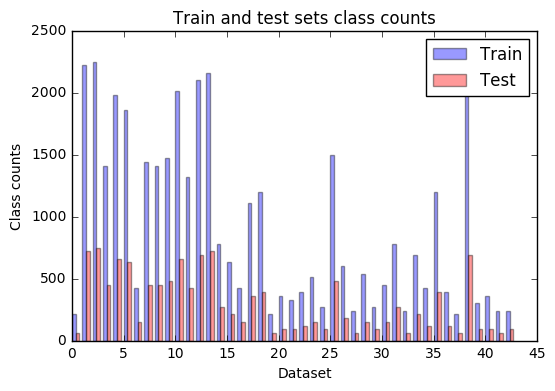

In [5]:
# displays the number of examples in test and training set in
# form of a bar chart
def train_test_distribution(X_train, y_train, X_test, y_test):
    bar_width = 0.35
    train_class, train_counts = np.unique(y_train, return_counts=True)
    test_class, test_counts = np.unique(y_test, return_counts=True)
    print(np.asarray((train_class, train_counts)))
    print(np.asarray((test_class, test_counts)))
    rects1 = plt.bar(train_class, train_counts, bar_width,
                     alpha=0.4,
                     color='b',
                     label='Train')

    rects2 = plt.bar(test_class + bar_width, test_counts, bar_width,
                     alpha=0.4,
                     color='r',
                     label='Test')
    plt.xlabel('Dataset')
    plt.ylabel('Class counts')
    plt.title('Train and test sets class counts')
    plt.legend()
    plt.show()
train_test_distribution(X_train, y_train, X_test, y_test)

----

## Step 2: Design and Test a Model Architecture

In [6]:
import cv2

# converts the pixel values of an image set
# in the given range
def normalize_dataset(image_set):
    normalized_set = list()
    for image in image_set:
        norm_img = np.zeros((32, 32))
        norm_image = cv2.normalize(image, 
                                   norm_img, 
                                   alpha=-0.5,
                                   beta=0.5,
                                   norm_type=cv2.NORM_MINMAX, 
                                   dtype=cv2.CV_32F)
        normalized_set.append(norm_image)
    return np.asarray(normalized_set)

# equalizes the R, G, B components of every image
# for an image set on a individual basis
def equalize_hist(image_set):
    equalized_set = list()
    for image in image_set:
        rgb = cv2.split(image)
        rgb[0] = cv2.equalizeHist(rgb[0])
        rgb[1] = cv2.equalizeHist(rgb[1])
        rgb[2] = cv2.equalizeHist(rgb[2])
        # merge the equalized image
        combined_image = cv2.merge(rgb)
        equalized_set.append(combined_image)
    return np.asarray(equalized_set)

In [7]:
# equalizes brightness of images
X_train_bright = equalize_hist(X_train)
X_test_bright = equalize_hist(X_test)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]


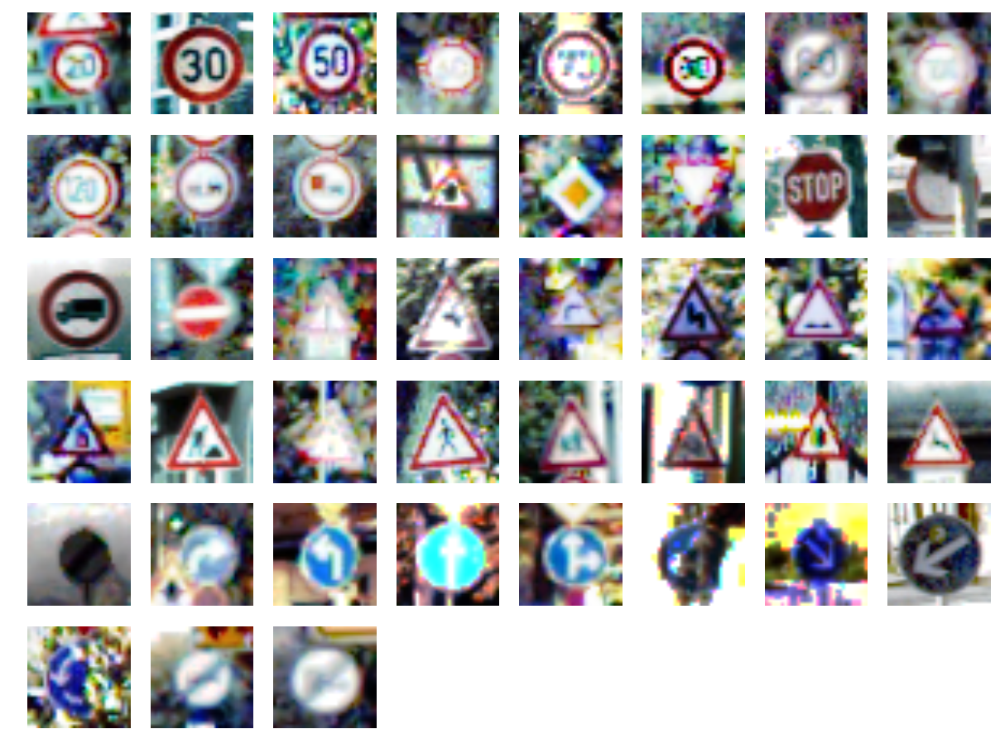

In [8]:
# we can see the effect of brightness normalization below.
# all images are brighter and image no 12, 18, 19, 20, 31, 33, 41 
# which could not be seen clearly ealier are now very clear.
show_images(X_train_bright, y_train)

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36 37 38 39 40 41 42]


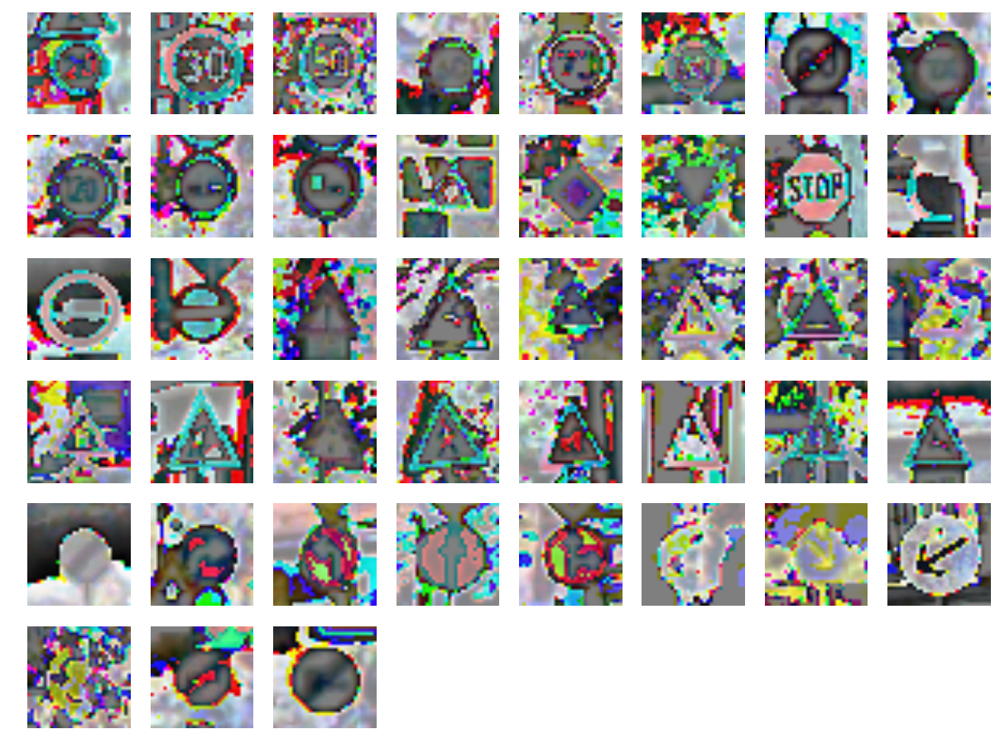

In [9]:
# scaling the images to range -0.5 to 0.5
X_train_norm = normalize_dataset(X_train_bright)
X_test_norm = normalize_dataset(X_test_bright)
show_images(X_train_norm, y_train)

### Question 1 

_Describe how you preprocessed the data. Why did you choose that technique?_

**Answer:**

_All the R, G, B components of images are first equalized for their brightness. This is done because some of the images are very dull and their sign cannot be really seen. We can see the improvement in brightness in figure 3. Some images can be seen more clearly and we can make out which sign it is representing._

_Next, images are noramlized in the range of -0.5 to 0.5 to make data well-conditioned._

_Earlier I was considering using grayscale images but surely, images like traffic signs can make good use of color channels. If we use grayscale images then we are indeed losing some of the important information. It is one of those scenarios where we a tradeoff between speed (since, three channels will take longer to process) and accuracy. I experimented with both grayscale and colored images and for my network architecture, colored images worked better._

_I also experimented with different scaling ranges -> 0.1 to 0.9; -1 to 1; 0 to 1 and -0.5 and 0.5. I got best results from -0.5 to 0.5._

In [10]:
# dividing data into training and validation.
# Since the classes are imbalanced, we are going to
# keep the same pattern in validation data as seen in
# training data. 
from sklearn.cross_validation import train_test_split
from sklearn.utils import shuffle

# shuffle the dataset before splitting to train and 
# validation set
X_train_norm, y_train_norm = shuffle(X_train_norm, y_train)

# validation set comprises of 30% of training set
# this set will have the same number of images per class
# as the training set
X_train_set, X_val_set, y_train_set, y_val_set = train_test_split(X_train_norm, 
                                                                  y_train_norm, 
                                                                  test_size=0.3,
                                                                  stratify=y_train,
                                                                  random_state=42)
print("Shape of training set: ", X_train_set.shape, y_train_set.shape)
print("Shape of validation set: ", X_val_set.shape, y_val_set.shape)

/home/shailly/anaconda3/envs/CarND-Traffic-Sign-Classifier-Project/lib/python3.5/site-packages/sklearn/cross_validation.py:44: DeprecationWarning: This module was deprecated in version 0.18 in favor of the model_selection module into which all the refactored classes and functions are moved. Also note that the interface of the new CV iterators are different from that of this module. This module will be removed in 0.20.
  "This module will be removed in 0.20.", DeprecationWarning)


Shape of training set:  (27446, 32, 32, 3) (27446,)
Shape of validation set:  (11763, 32, 32, 3) (11763,)


### Question 2

_Describe how you set up the training, validation and testing data for your model. **Optional**: If you generated additional data, how did you generate the data? Why did you generate the data? What are the differences in the new dataset (with generated data) from the original dataset?_

**Answer:**

_I took off 30% of the training data to keep aside as validation set. This data is stratifeid so that the validation set has the same number of images per class as training set. This way we can eliminate the class-imbalance problem as posed in train-test-distribution figure._

Optional generating of additional data:
_I experimented with generating additional data by creating 4 images per image in the train set after the train set was divided into train and validation set. But this did not really give me a better accuracy. I would have tried to attack this area with another strategy where I create extra images for the classes which have lesser number of images as compared to others and try to bring images per class number to a constant._

_On getting good results with non-augmented data, I decided not to use additional images because the network takes a lot of time to train in this case. Code for generating additional data is given below but not executed._

In [ ]:
### Generate data additional data (THIS CODE IS NOT USED)
### and split the data into training/validation/testing sets here.
### Feel free to use as many code cells as needed.

# input: takes in an image, maximum rotation angle
# and maximum translation in x and y direction
def augment_image(image, max_rotate, max_translate):
    # random transformation in terms of angle and 
    # translations are performed
    (height, width) = image.shape[:2]
    center = (width/2, height/2)
    random_angle = np.random.uniform(-max_rotate, max_rotate)
    
    # rotate image with random angles
    matrix_random_angle = cv2.getRotationMatrix2D(center, random_angle, 1.0)
    image = cv2.warpAffine(image, matrix_random_angle, (width, height))
    
    # translate image with random x and y coordinates
    x_translate = max_translate * width * np.random.uniform(-1, 1)
    y_translate = max_translate * height * np.random.uniform(-1, 1)
    matrix_random_translate = np.array([[1, 0, x_translate], [0, 1, y_translate]])
    image = cv2.warpAffine(image, matrix_random_translate, (width, height))
    
    return image


# creating 4 augmented images for all images in the train set
import cv2
new_augmented_images = list()
new_y = list()
print(X_train_norm.shape)
for image_index in range(len(X_train_norm)):
    y = y_train[image_index]
    for x in range(4):
        new_image = augment_image(X_train_norm[image_index], 15, 0.2)
        new_augmented_images.append(new_image)
        new_y.append(y)
new_augmented_images = np.asarray(new_augmented_images)
print(new_augmented_images.shape)

new_y = np.asarray(new_y)
X_train_new = np.concatenate((X_train_norm, new_augmented_images), axis=0)
y_train_new = np.concatenate((y_train, new_y), axis=0)
print("Shape of training after augmentation: ", X_train_new.shape)

## Model Architecture

In [11]:
from tensorflow.contrib.layers import flatten
import tensorflow as tf
def TrafficNet(x):
    mu = 0
    sigma = 0.05
    
    # a 1x1 filter for color map
    conv0_w = tf.Variable(tf.truncated_normal(shape=(1, 1, 3, 3), mean=mu, stddev=sigma))
    conv0_b = tf.Variable(tf.zeros(3))
    conv0 = tf.nn.conv2d(x, conv0_w, strides=[1,1,1,1], padding='SAME') + conv0_b
    conv0 = tf.nn.relu(conv0)
    
    # conv1 input shape 32x32x3
    # output shape 28x28x32
    conv1_w = tf.Variable(tf.truncated_normal(shape=(5, 5, 3, 32), mean=mu, stddev=sigma))
    conv1_b = tf.Variable(tf.zeros(32))
    conv1 = tf.nn.conv2d(conv0, 
                         conv1_w, 
                         strides=[1, 1, 1, 1], 
                         padding='VALID') + conv1_b
    
    # activation
    conv1 = tf.nn.relu(conv1)
    
    # pooling input shape = 28x28x32
    # output shape 14x14x32
    conv1 = tf.nn.max_pool(conv1,
                           ksize=[1, 2, 2, 1],
                           strides=[1, 2, 2, 1],
                           padding='SAME')
    conv1 = tf.nn.dropout(conv1, keep_prob)
    
    # input shape 14x14x32
    # output shape 10x10x64
    conv2_w = tf.Variable(tf.truncated_normal(shape=(5, 5, 32, 64), mean=mu, stddev=sigma))
    conv2_b = tf.Variable(tf.zeros(64))
    conv2 = tf.nn.conv2d(conv1, conv2_w, strides=[1, 1, 1, 1], padding='VALID') + conv2_b
    
    # activation
    conv2 = tf.nn.relu(conv2)
    
    # pooling
    # output shape 10x10x64
    conv2 = tf.nn.max_pool(conv2, ksize=[1, 2, 2, 1], strides=[1, 2, 2, 1], padding='SAME')
    
    #Dropout Layer
    conv2 = tf.nn.dropout(conv2, keep_prob)
    
    # input shape 5x5x64
    #output shape 4x4x128
    conv3_w = tf.Variable(tf.truncated_normal(shape=(2, 2, 64, 128), mean=mu, stddev=sigma))
    conv3_b = tf.Variable(tf.zeros(128))
    conv3 = tf.nn.conv2d(conv2, conv3_w, strides=[1, 1, 1, 1], padding='VALID') + conv3_b
    
    # activation
    conv3 = tf.nn.relu(conv3)
    
    # pooling
    # output shape 4x4x128
    conv3 = tf.nn.max_pool(conv3, ksize=[1, 2, 2, 1], strides=[1, 1, 1, 1], padding='SAME')
    
    #Dropout Layer
    conv3 = tf.nn.dropout(conv3, keep_prob)
    
    
    # flatten
    conv3 = flatten(conv3)
    
    # fully connected layer
    # Input = 2048. Output = 1024.
    fc1_W  = tf.Variable(tf.truncated_normal(shape=(2048, 1024), mean = mu, stddev = sigma))
    fc1_b  = tf.Variable(tf.zeros(1024))
    fc1 = tf.matmul(conv3, fc1_W) + fc1_b
    
    #Dropout Layer
    fc1 = tf.nn.dropout(fc1, keep_prob)
    
    # fully connected layer
    # Input = 1024. Output = 120.
    fc2_W  = tf.Variable(tf.truncated_normal(shape=(1024, 120), mean = mu, stddev = sigma))
    fc2_b  = tf.Variable(tf.zeros(120))
    fc2 = tf.matmul(fc1, fc2_W) + fc2_b
    
    #Dropout Layer
    fc2 = tf.nn.dropout(fc2, keep_prob)
    
    # fully connected layer
    # Fully Connected. Input = 120. Output = 43.
    fc3_W  = tf.Variable(tf.truncated_normal(shape=(120, 43), mean = mu, stddev = sigma))
    fc3_b  = tf.Variable(tf.zeros(43))
    logits = tf.matmul(fc2, fc3_W) + fc3_b
    
    
    return logits

### Question 3

_What does your final architecture look like? (Type of model, layers, sizes, connectivity, etc.)  

**Answer:**

_Refer to figure below for model architecture. It is a convolutional neural network consisting of four sets of convolutional, activation, and pooling layers, followed by three fully-connected layers, activation, and finally a softmax classifier (image source)._

_The first layer is used so that the best color map can be identified by the model itself. It is a form of 1x1 convolution with depth of 3 and essentially, it acts as a layer which can find the best color map for our model._

_Every layer is also followed by a dropout with a probability of 0.5. This helps in preventing overfitting._

_Connectivity can be shown as_

INPUT => CONV => RELU => CONV => RELU => POOL => DROPOUT => CONV => RELU => POOL => DROPOUT => CONV => RELU => POOL => DROPOUT => FC => DROPOUT => FC => DROPOUT => FC

_Sizes can be seen from the figure as well as code. Strides and filter depths (k) are a result of parameter optimization._

In [62]:
image = cv2.cvtColor(cv2.imread("cnn_arc.jpeg", 1), cv2.COLOR_BGR2RGB)

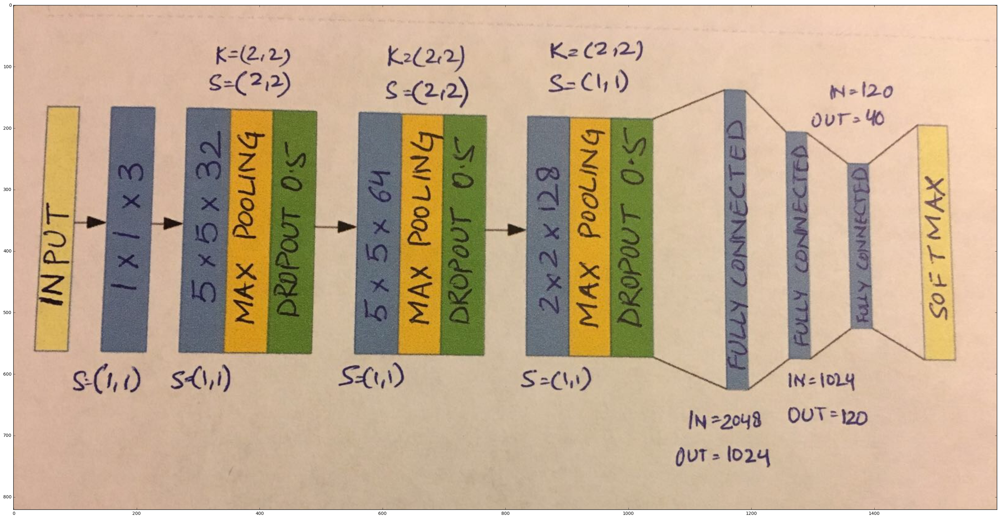

In [64]:
plt.figure(figsize=(40, 60))
plt.imshow(image)

In [12]:
# tensorflow placeholders for input, labels and
# dropouts
x = tf.placeholder(tf.float32, (None, 32, 32, 3))
y = tf.placeholder(tf.int32, (None))
# Placeholder for dropout keep probability
keep_prob = tf.placeholder(tf.float32)
one_hot_y = tf.one_hot(y, 43)

In [13]:
# learning rate
rate = 0.001

# softmax logits
logits = TrafficNet(x)

# finding cross entropy after passing logits through
# softmax
cross_entropy = tf.nn.softmax_cross_entropy_with_logits(logits, one_hot_y)

# defining loss for optimization by minimizing the 
# mean cross entropy
loss_operation = tf.reduce_mean(cross_entropy)

# using Adam Optimizer for minimizing loss with the 
# learning rate specified above
optimizer = tf.train.AdamOptimizer(learning_rate=rate)
training_operation = optimizer.minimize(loss_operation)

In [14]:
correct_prediction = tf.equal(tf.argmax(logits, 1), tf.argmax(one_hot_y, 1))
accuracy_operation = tf.reduce_mean(tf.cast(correct_prediction, tf.float32))
saver = tf.train.Saver()
BATCH_SIZE = 256

# evaluate function for finding accuracy of a batch and later
# calculating overall accuracy for a given epoch over 
# validation set
def evaluate(X_data, y_data):
    num_examples = len(X_data)
    total_accuracy = 0
    sess = tf.get_default_session()
    for offset in range(0, num_examples, BATCH_SIZE):
        batch_x, batch_y = X_data[offset:offset+BATCH_SIZE], y_data[offset:offset+BATCH_SIZE]
        accuracy = sess.run(accuracy_operation, feed_dict={x: batch_x, y:batch_y, keep_prob:1.0})
        total_accuracy += (accuracy * len(batch_x))
    return total_accuracy/num_examples
    

In [15]:
# training the model
DROPOUT = 0.50
EPOCHS = 20
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train_set)
    print("TRAINING..")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train_set, y_train_set)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x:batch_x, y:batch_y, keep_prob:DROPOUT})
        
        validation_accuracy = evaluate(X_val_set, y_val_set)
        print("EPOCH {} ...".format(i+1))
        print("VALIDATION ACCURACY = {:.3f}".format(validation_accuracy))
        print()
    print("Training completed")

TRAINING..

EPOCH 1 ...
VALIDATION ACCURACY = 0.238

EPOCH 2 ...
VALIDATION ACCURACY = 0.565

EPOCH 3 ...
VALIDATION ACCURACY = 0.795

EPOCH 4 ...
VALIDATION ACCURACY = 0.904

EPOCH 5 ...
VALIDATION ACCURACY = 0.933

EPOCH 6 ...
VALIDATION ACCURACY = 0.946

EPOCH 7 ...
VALIDATION ACCURACY = 0.960

EPOCH 8 ...
VALIDATION ACCURACY = 0.970

EPOCH 9 ...
VALIDATION ACCURACY = 0.971

EPOCH 10 ...
VALIDATION ACCURACY = 0.972

EPOCH 11 ...
VALIDATION ACCURACY = 0.976

EPOCH 12 ...
VALIDATION ACCURACY = 0.982

EPOCH 13 ...
VALIDATION ACCURACY = 0.982

EPOCH 14 ...
VALIDATION ACCURACY = 0.984

EPOCH 15 ...
VALIDATION ACCURACY = 0.984

EPOCH 16 ...
VALIDATION ACCURACY = 0.986

EPOCH 17 ...
VALIDATION ACCURACY = 0.988

EPOCH 18 ...
VALIDATION ACCURACY = 0.984

EPOCH 19 ...
VALIDATION ACCURACY = 0.986

EPOCH 20 ...
VALIDATION ACCURACY = 0.987

Training completed


### Question 4

_How did you train your model? (Type of optimizer, batch size, epochs, hyperparameters, etc.)_


**Answer:**

_Type of optimizer: Adam optimizer since it is more efficient in many cases. Did not experiment with other optimizers_

_Batch size: experimented with sizes of 128, 256, 512 and found that 256 works the best._

_Epochs: 20 epochs. Experimented with sizes 30, 40 but did not have much positive impact._

_Loss function: minizing the mean cross entropy for optimaztion._

_Nonlinearity: RELU_

_Weights: setting initial weights as a random sample from a normal distribution of 0 zero mean and standard deviation 0.05 gave best results. Experimented with stddev=1 and a constant value of 0._

### Question 5


_What approach did you take in coming up with a solution to this problem? It may have been a process of trial and error, in which case, outline the steps you took to get to the final solution and why you chose those steps. Perhaps your solution involved an already well known implementation or architecture. In this case, discuss why you think this is suitable for the current problem._

**Answer:**

_I did not start with LeNet architecture but with incrementally adding one layer at a time to this multi-layer model. Initially it was a single layer CNN with one fully connected layer. After adding another layer, I was getting an accuracy of 88% on validation set._

_After seeing this result, I knew how would a basic model would perform so then I went ahead and implemented the LeNet model. My model is also inspired by Vivek Yadav's post on Medium about his architecture but is not a copy of it. It is more of a mixture of both LeNet and his models._

_Experiments showed that adding the first layer for color scheme surely adds a bit to the accuracy. _

_Since, LeNet was for grayscale images, I wanted to make my model wider by adding more filters than the LeNet model. I think this really helped because we are capturing more depth of the image given that these traffic signs are way more complex than LeNet images._

_Strides and filter sizes are mostly inspired by LeNet. Since, LeNet has only two layers, the strides in third layer in my model are a result of hit and trial._

_I experimented on the model with and without dropouts and using dropouts was a clean winner. I used dropouts of 0.25, 0.75 and 0.50 and best results were obtained by using 0.5._

_I went from adding one fully connected layer, to two and finally to three and the accuracy certainly increased. _

---

## Step 3: Test a Model on New Images

Take several pictures of traffic signs that you find on the web or around you (at least five), and run them through your classifier on your computer to produce example results. The classifier might not recognize some local signs but it could prove interesting nonetheless.

You may find `signnames.csv` useful as it contains mappings from the class id (integer) to the actual sign name.

### Implementation

Use the code cell (or multiple code cells, if necessary) to implement the first step of your project. Once you have completed your implementation and are satisfied with the results, be sure to thoroughly answer the questions that follow.

In [16]:
# combining train and validation set to be run 
# on the same architecture
# since the hyper-parameters and model architecture
# are finalized, we can utilize the remaining 30%
# of the dataset to train on
DROPOUT = 0.50
EPOCHS = 20
with tf.Session() as sess:
    sess.run(tf.global_variables_initializer())
    num_examples = len(X_train_norm)
    print("TRAINING..")
    print()
    for i in range(EPOCHS):
        X_train, y_train = shuffle(X_train_norm, y_train_norm)
        for offset in range(0, num_examples, BATCH_SIZE):
            end = offset + BATCH_SIZE
            batch_x, batch_y = X_train[offset:end], y_train[offset:end]
            sess.run(training_operation, feed_dict={x:batch_x, y:batch_y, keep_prob:DROPOUT})
        print("EPOCH {} ...".format(i+1))
        print()
        
    saver.save(sess, 'trafficNet')
    print("Model saved")

TRAINING..

EPOCH 1 ...

EPOCH 2 ...

EPOCH 3 ...

EPOCH 4 ...

EPOCH 5 ...

EPOCH 6 ...

EPOCH 7 ...

EPOCH 8 ...

EPOCH 9 ...

EPOCH 10 ...

EPOCH 11 ...

EPOCH 12 ...

EPOCH 13 ...

EPOCH 14 ...

EPOCH 15 ...

EPOCH 16 ...

EPOCH 17 ...

EPOCH 18 ...

EPOCH 19 ...

EPOCH 20 ...

Model saved


In [17]:
# first of all we will check how did the model perform
# on test set to guage its performance
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    test_accuracy = evaluate(X_test_norm, y_test)
    print("Test Accuracy = {:.3f}".format(test_accuracy))

Test Accuracy = 0.971


In [18]:
# following are the 21 images taken from web
# to test our model on
# few of these images are the ones on which the
# model is not trained. Their actual labels are marked as
# -1 and predicted values are marked as NA

image_list = ['donot.jpeg', 'stops.jpeg', 'yield.jpeg', 'ahead.jpeg', 'round.jpeg', '120.jpeg', 'slip.jpeg',
              'road.jpeg', '20.jpg', '30.jpeg', 'sl50.jpeg', 'ped.jpeg', 'pred_tri.jpeg', 'yellow_pred.jpeg',
              'children_crossing.jpg', 'bicycle.jpg', 'ele.jpeg', 'max40.jpeg', 'noleft.jpeg', 'norightt.jpeg',
              'wr.jpeg']

reshaped_images = list()
# reshaping image to 32x32 as needed by the network
for image in image_list:
    image = cv2.cvtColor(cv2.imread(image, 1), cv2.COLOR_BGR2RGB)
    resized_image = cv2.resize(image, (32, 32))
    reshaped_images.append(resized_image)


In [19]:
# preprocess these images just as training images were
X_new_test_bright = equalize_hist(reshaped_images)
X_new_test_norm = normalize_dataset(X_new_test_bright)

In [20]:
# defining predicition function which gives the
# predicted label
prediction_operation = tf.argmax(logits, 1)
# actual labels of new test images
# -1 shows these images were not present in training
expected_predictions = [17, 14, 13, 35, 40, 8, 23, 25, 0, 1, 2, 27, 27, 27, 28, 29, -1, -1, -1, -1, -1, -1]

# calculate predictions in a current session
def get_preds(X_data):
    sess = tf.get_default_session()
    prediction = sess.run(prediction_operation, feed_dict={x: X_data, keep_prob:1.0})
    return prediction

# seeing results on new test set
with tf.Session() as sess:
    saver.restore(sess, tf.train.latest_checkpoint('.'))
    preds = get_preds(X_new_test_norm)
    print("New predictions:", preds)
print("Expected Predictions: ", expected_predictions)

New predictions: [17 14 13 35 40  5 31 25 16  5  5  4 24  5  3 30 28 33 19  8  6]
Expected Predictions:  [17, 14, 13, 35, 40, 8, 23, 25, 0, 1, 2, 27, 27, 27, 28, 29, -1, -1, -1, -1, -1, -1]


### Question 6

_Choose five candidate images of traffic signs and provide them in the report. Are there any particular qualities of the image(s) that might make classification difficult? It could be helpful to plot the images in the notebook._



**Answer:**

_First of all, lets see the overall performance of our network on the new test images._

_Specifically, I would like to talk about images which did not get predicted properly._

_1. 120 km/hr - not very obvious. Maybe due to the curve on top of 2 combined with 1 in the beginning seems like an 8_

_2. Slippery road - does resemble animal crossing on some level. Number of examples are less as compared to others so model might not have been able to learn it properly._

_3. Speed limit 20 - very few examples might have led to misclassification._

_4. Speed limit 30 - confusion may arise due to similarities in digits 3 and 8._

_5. Speed limit 50 - due to presence of shadow, the 5 does look like an 8._

_6. Pedestrains - I used three different images for this class but in every case the classifier failed. This is probably because number of examples is just 240 for this class which is not sufficient for the model. Also, shape of the sign board matters a lot._

_7. Children crossing - can't think of why it is predicted this way_

_8. Bicycle crossing - might resemble ice/snow on some level_

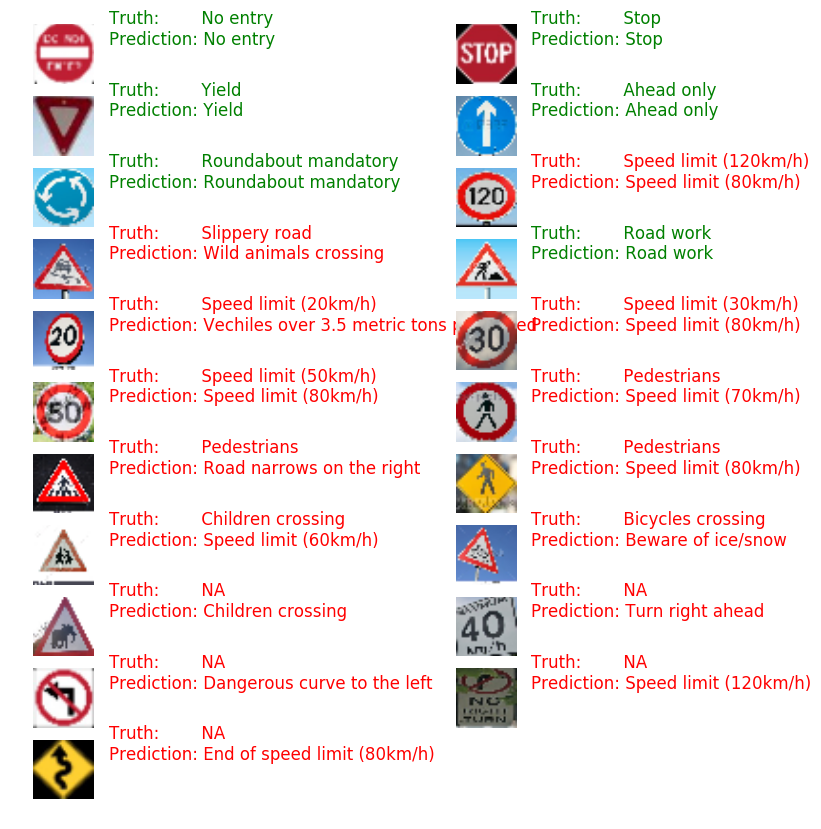

In [21]:
# Display the predictions and the ground truth visually.
fig = plt.figure(figsize=(10, 10))

for i in range(len(reshaped_images)):
    truth = expected_predictions[i]
    prediction = preds[i]
    plt.subplot(11, 2,1+i)
    plt.axis('off')
    color='green' if truth == prediction else 'red'
    if truth==-1:
        truth = 'NA'
    else:
        truth = signnames_df[signnames_df['ClassId']==truth].values[0][1]
    prediction = signnames_df[signnames_df['ClassId']==prediction].values[0][1]
    plt.text(40, 10, "Truth:        {0}\nPrediction: {1}".format(truth, prediction), 
             fontsize=12, color=color)
    plt.imshow(reshaped_images[i])

### Question 7

_Is your model able to perform equally well on captured pictures when compared to testing on the dataset? The simplest way to do this check the accuracy of the predictions. For example, if the model predicted 1 out of 5 signs correctly, it's 20% accurate._

_**NOTE:** You could check the accuracy manually by using `signnames.csv` (same directory). This file has a mapping from the class id (0-42) to the corresponding sign name. So, you could take the class id the model outputs, lookup the name in `signnames.csv` and see if it matches the sign from the image._


**Answer:**
My model does not perform well on the new images. If I leave the images on which the model was not trained on (marked as NA), I get 6 out of 16 images right which means accuracy is 37.5%. 

### Question 8

*Use the model's softmax probabilities to visualize the **certainty** of its predictions, [`tf.nn.top_k`](https://www.tensorflow.org/versions/r0.12/api_docs/python/nn.html#top_k) could prove helpful here. Which predictions is the model certain of? Uncertain? If the model was incorrect in its initial prediction, does the correct prediction appear in the top k? (k should be 5 at most)*

`tf.nn.top_k` will return the values and indices (class ids) of the top k predictions. So if k=3, for each sign, it'll return the 3 largest probabilities (out of a possible 43) and the correspoding class ids.

Take this numpy array as an example:

```
# (5, 6) array
a = np.array([[ 0.24879643,  0.07032244,  0.12641572,  0.34763842,  0.07893497,
         0.12789202],
       [ 0.28086119,  0.27569815,  0.08594638,  0.0178669 ,  0.18063401,
         0.15899337],
       [ 0.26076848,  0.23664738,  0.08020603,  0.07001922,  0.1134371 ,
         0.23892179],
       [ 0.11943333,  0.29198961,  0.02605103,  0.26234032,  0.1351348 ,
         0.16505091],
       [ 0.09561176,  0.34396535,  0.0643941 ,  0.16240774,  0.24206137,
         0.09155967]])
```

Running it through `sess.run(tf.nn.top_k(tf.constant(a), k=3))` produces:

```
TopKV2(values=array([[ 0.34763842,  0.24879643,  0.12789202],
       [ 0.28086119,  0.27569815,  0.18063401],
       [ 0.26076848,  0.23892179,  0.23664738],
       [ 0.29198961,  0.26234032,  0.16505091],
       [ 0.34396535,  0.24206137,  0.16240774]]), indices=array([[3, 0, 5],
       [0, 1, 4],
       [0, 5, 1],
       [1, 3, 5],
       [1, 4, 3]], dtype=int32))
```

Looking just at the first row we get `[ 0.34763842,  0.24879643,  0.12789202]`, you can confirm these are the 3 largest probabilities in `a`. You'll also notice `[3, 0, 5]` are the corresponding indices.

In [51]:
with tf.Session() as sess:
    sess = tf.get_default_session()
    saver.restore(sess, tf.train.latest_checkpoint('.'))

    logits_ph = tf.placeholder('float', [None, 43])
    softmax = tf.nn.softmax(logits_ph)
    
    # obtain logits for new images calculated by the model
    logits_received = sess.run(logits, feed_dict={x: X_new_test_norm, keep_prob: 1.})
    # operation for top k values and indices
    top_5_values, top_5_indices = tf.nn.top_k(softmax, k=5)
    # find the top 5 values and their indices based on the logits received
    top_5_vals, top_5_ids = sess.run([top_5_values, top_5_indices], feed_dict={logits_ph: logits_received})

In [52]:
def pred_certainty_str(top_5_val, top_5_indices):
    # Convert top k indices into strings
    top_5_pred = [signnames_df[signnames_df['ClassId']==index].values[0][1] for index in top_5_indices]
    predictions = ''
    for i in range(5):
        predictions += '%s: %.2f%%\n' % (top_5_pred[i].replace('\n', ''), top_5_val[i] * 100)
    return predictions

No entry: 59.83%
Vechiles over 3.5 metric tons prohibited: 19.08%
No passing: 16.94%
End of all speed and passing limits: 0.52%
End of no passing: 0.49%



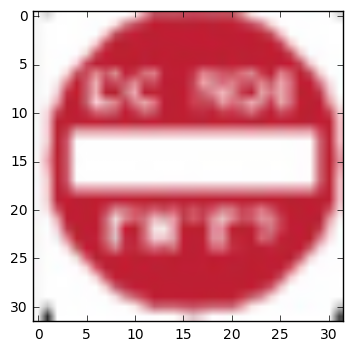

In [53]:
# correct prediction, very sure
plt.imshow(reshaped_images[0])
print(pred_certainty_str(top_5_vals[0], top_5_ids[0]))

Stop: 87.53%
Road work: 8.95%
Speed limit (60km/h): 1.08%
Speed limit (20km/h): 0.94%
Speed limit (80km/h): 0.93%



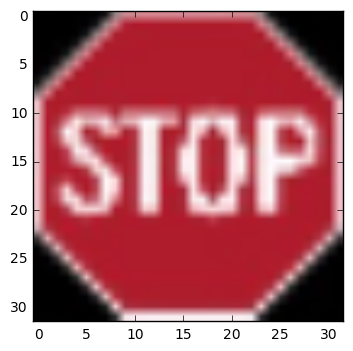

In [33]:
# correct prediction, highly sure
plt.imshow(reshaped_images[1])
print(pred_certainty_str(top_5_vals[1], top_5_ids[1]))

Yield: 100.00%
End of speed limit (80km/h): 0.00%
Turn left ahead: 0.00%
Priority road: 0.00%
Go straight or right: 0.00%



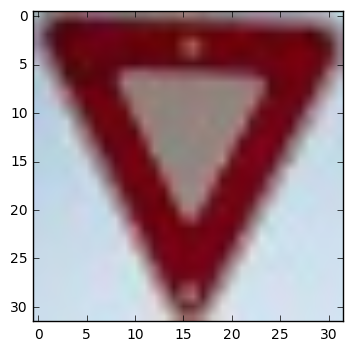

In [46]:
# correct prediction
# completely sure
plt.imshow(reshaped_images[2])
print(pred_certainty_str(top_5_vals[2], top_5_ids[2]))

Road narrows on the right: 100.00%
Pedestrians: 0.00%
Children crossing: 0.00%
General caution: 0.00%
Speed limit (20km/h): 0.00%



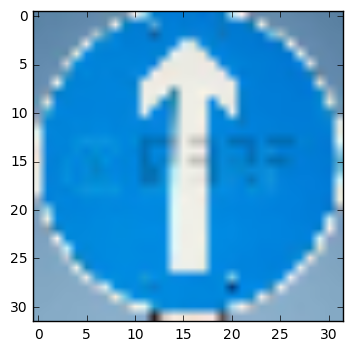

In [47]:
# correct prediction
# completely sure
plt.imshow(reshaped_images[3])
print(pred_certainty_str(top_5_vals[3], top_5_ids[12]))

Roundabout mandatory: 99.00%
Keep right: 0.32%
Speed limit (100km/h): 0.23%
Turn right ahead: 0.17%
Go straight or left: 0.06%



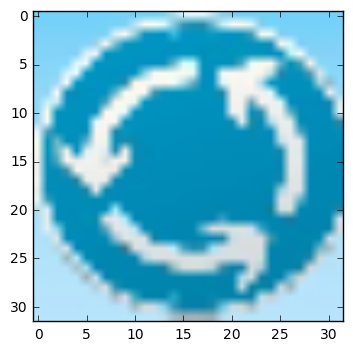

In [48]:
# correct prediction
# almost completely sure
plt.imshow(reshaped_images[4])
print(pred_certainty_str(top_5_vals[4], top_5_ids[4]))

Speed limit (80km/h): 48.46%
Speed limit (60km/h): 18.41%
Speed limit (120km/h): 13.01%
Speed limit (100km/h): 8.94%
Speed limit (20km/h): 5.82%



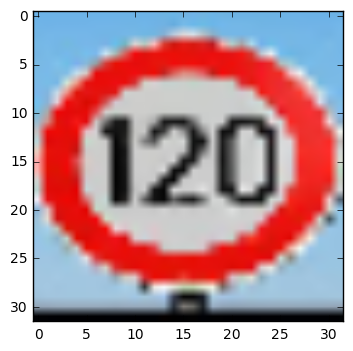

In [34]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[5])
print(pred_certainty_str(top_5_vals[5], top_5_ids[5]))

Wild animals crossing: 66.19%
Beware of ice/snow: 11.73%
Bicycles crossing: 11.71%
Slippery road: 2.85%
Double curve: 2.38%



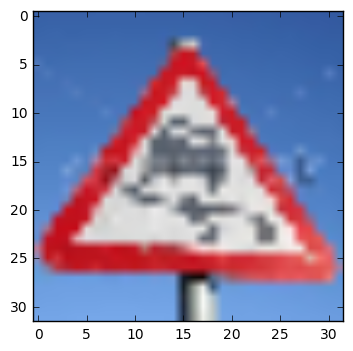

In [36]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[6])
print(pred_certainty_str(top_5_vals[6], top_5_ids[6]))

Vechiles over 3.5 metric tons prohibited: 58.79%
Speed limit (60km/h): 20.25%
No passing: 10.34%
Speed limit (20km/h): 3.83%
Speed limit (80km/h): 2.58%



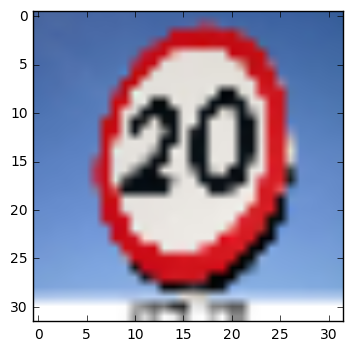

In [37]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[8])
print(pred_certainty_str(top_5_vals[8], top_5_ids[8]))

Speed limit (80km/h): 53.66%
Speed limit (50km/h): 26.10%
Dangerous curve to the right: 6.72%
Speed limit (60km/h): 3.50%
Wild animals crossing: 3.04%



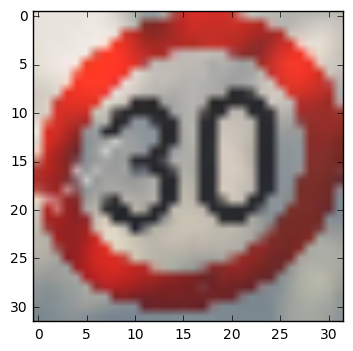

In [39]:
# incorrect prediction
# correct prediction not in top 5
plt.imshow(reshaped_images[9])
print(pred_certainty_str(top_5_vals[9], top_5_ids[9]))

Speed limit (80km/h): 73.02%
Speed limit (50km/h): 16.92%
Speed limit (60km/h): 5.39%
Keep right: 3.10%
Speed limit (100km/h): 1.17%



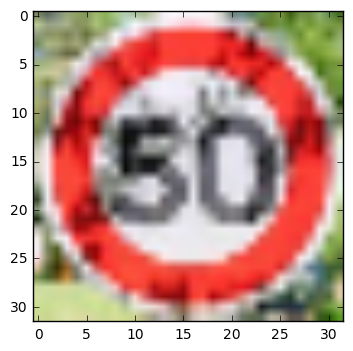

In [40]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[10])
print(pred_certainty_str(top_5_vals[10], top_5_ids[10]))

Speed limit (70km/h): 63.50%
General caution: 28.36%
Pedestrians: 3.14%
Speed limit (20km/h): 1.27%
Road narrows on the right: 1.22%



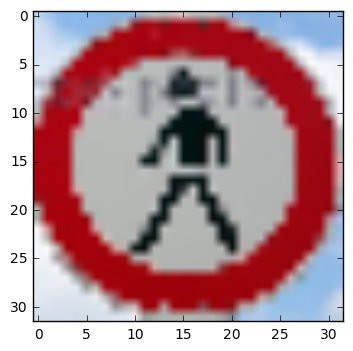

In [41]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[11])
print(pred_certainty_str(top_5_vals[11], top_5_ids[11]))

Road narrows on the right: 99.74%
Pedestrians: 0.19%
Children crossing: 0.03%
General caution: 0.01%
Speed limit (20km/h): 0.01%



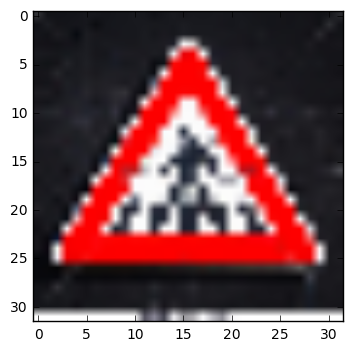

In [42]:
# incorrect prediction
# correct prediction in top 5
plt.imshow(reshaped_images[12])
print(pred_certainty_str(top_5_vals[12], top_5_ids[12]))

Speed limit (80km/h): 32.97%
Speed limit (70km/h): 13.94%
General caution: 10.34%
Speed limit (100km/h): 7.75%
Speed limit (30km/h): 6.55%



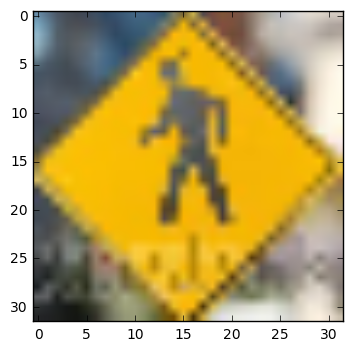

In [43]:
# incorrect prediction
# correct prediction not in top 5
plt.imshow(reshaped_images[13])
print(pred_certainty_str(top_5_vals[13], top_5_ids[13]))

Speed limit (60km/h): 94.78%
Speed limit (80km/h): 3.29%
Beware of ice/snow: 0.89%
End of no passing by vechiles over 3.5 metric tons: 0.37%
Road work: 0.18%



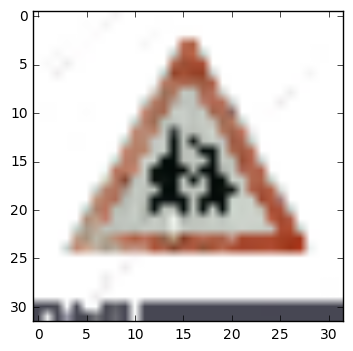

In [44]:
# incorrect prediction
# correct prediction not in top 5
plt.imshow(reshaped_images[14])
print(pred_certainty_str(top_5_vals[14], top_5_ids[14]))

Beware of ice/snow: 26.88%
Wild animals crossing: 19.65%
No entry: 16.16%
Speed limit (80km/h): 13.19%
Speed limit (100km/h): 9.81%



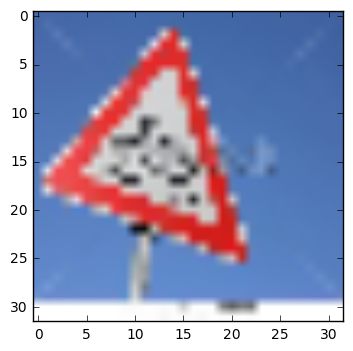

In [45]:
# incorrect prediction
# correct prediction not in top 5
plt.imshow(reshaped_images[15])
print(pred_certainty_str(top_5_vals[15], top_5_ids[15]))

**Answer:**

_Out of 10 images that were predicted incorrectly, 6 have the correct label in top 5 predictions._

_I believe, classes like Pedestrian crossing, children crossing, beware of ice/snow can really do well with more samples._

_The right approach would be to create more samples by augmentation for these classes and try to bring samples per class value to a constant._

_I ran the same model (except for the first layer) on grayscale images and found that the results were more or less the same. Just that running this model on grayscale images is faster._

_Same model was also run on augmented images where more images were created in such a way that every class has 2250 samples in it. Due to lack of time, I could not create a different model for this data and running this data on the same model gave 93.4% accuracy on test set with a dropout of 0.75 even though the validation accuracy reached upto 99%. This model is overfitting but I could not find time to dig into it. It is an interesting aspect and I would like to get deeper into this later._